# 📝 Time Series - Machine Temperature

## 🌟 Highlights 
From this project "Time Series - Machine Temperature", the highlights are addressed as:
- ...

## ℹ️ Project Introduction 
**What is time series dataset**  
Time series data is data collected sequentially over time (e.g., every minute, hour, or day).  
A key characteristic is temporal dependency: the value at time t is often related to values at earlier times (t-1, t-2, …).  
Due to this specific characteristic, random split of data for analysis is not suitable and will pose a negative effect to the coming outcome.   

**Machine temperature time series data**  
In the manufacturing company, machine generates revenue by producing products.      
However, unexpected machine issue can result in production stop, defective products, and huge recovery cost.    
To balance production efficiency and machine maintenence, companyies rely on machine condition monitor as an important defense.

Among many machine monitor signals, machine operating temperature is one of the most critical indicators of meachine health.  
In this project, a time series dataset records machine operating temperature at different moment.  
By analyzing the relationship between machine temperature and time with time series analysis, many insights can be unveiled for necessary arrangment and action.   

## 🎯 Mission & Goal
As a data scentist working in manufacturing company, my main job is to monitor machine condition and flag any potential abnormality early.  
Using machine temperature time series data, this project aims to:
- Uncover the hidden pattern of the time series data
- Detect anomalies early based on the machine operating temperature over time
- Forcast machine temperature to anticipate any future risk

## 🧠 Thinking



## 🏭 Build Flow
- Import libraries
- Data cleaning & EDA
- Anomaly detection
  - Z score method and improvement
  - 

## 💡 To Do


### Import Libraries

In [23]:
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.dates as mdates
import numpy as np
import plotly.express as px

from itertools import product

from statsmodels.tsa.seasonal import STL
from statsmodels.tsa.stattools import acf
from statsmodels.graphics.tsaplots import plot_acf

### Data cleaning & EDA
- Data collection frequency
- Data type correction
- Missing data
- Visualization
- Rolling mean & Rolling std

In [2]:
file = r'D:\coding\2026\time_series_analysis\realKnownCause\realKnownCause\machine_temperature_system_failure.csv'

df = pd.read_csv(file)
df.head(10)

,timestamp,value
0,2013-12-02 21:15:00,73.967322
1,2013-12-02 21:20:00,74.935882
2,2013-12-02 21:25:00,76.124162
3,2013-12-02 21:30:00,78.140707
4,2013-12-02 21:35:00,79.329836
5,2013-12-02 21:40:00,78.710418
6,2013-12-02 21:45:00,80.269784
7,2013-12-02 21:50:00,80.272828
8,2013-12-02 21:55:00,80.353425
9,2013-12-02 22:00:00,79.486523


Data is collected every 5 mins

In [3]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 22695 entries, 0 to 22694
Data columns (total 2 columns):
 #   Column     Non-Null Count  Dtype  
---  ------     --------------  -----  
 0   timestamp  22695 non-null  object 
 1   value      22695 non-null  float64
dtypes: float64(1), object(1)
memory usage: 354.7+ KB


timestamp column is not datetime data type 

In [4]:
# Change timestamp to datetime
df['time'] = pd.to_datetime(df['timestamp'])
df.head()

,timestamp,value,time
0,2013-12-02 21:15:00,73.967322,2013-12-02 21:15:00
1,2013-12-02 21:20:00,74.935882,2013-12-02 21:20:00
2,2013-12-02 21:25:00,76.124162,2013-12-02 21:25:00
3,2013-12-02 21:30:00,78.140707,2013-12-02 21:30:00
4,2013-12-02 21:35:00,79.329836,2013-12-02 21:35:00


In [5]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 22695 entries, 0 to 22694
Data columns (total 3 columns):
 #   Column     Non-Null Count  Dtype         
---  ------     --------------  -----         
 0   timestamp  22695 non-null  object        
 1   value      22695 non-null  float64       
 2   time       22695 non-null  datetime64[ns]
dtypes: datetime64[ns](1), float64(1), object(1)
memory usage: 532.0+ KB


In [6]:
print(df.shape)
df['value'].isnull().value_counts()

(22695, 3)


False    22695
Name: value, dtype: int64

No missing data

#### Visualization

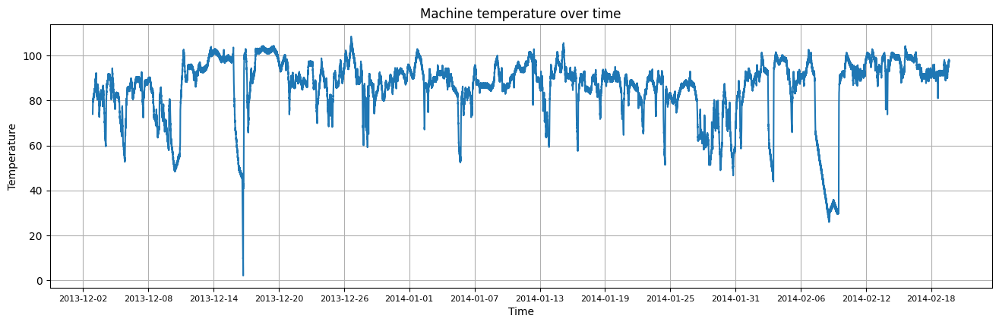

In [7]:
# Visualize line plot - temperature vs time
plt.figure(figsize=(16, 4.5))
plt.plot(df['time'], df['value'])
plt.xlabel('Time')
plt.ylabel('Temperature')
plt.xticks(fontsize=8)
plt.gca().xaxis.set_major_locator(mdates.DayLocator(interval=6))
plt.grid(True)
plt.title('Machine temperature over time')
plt.show()

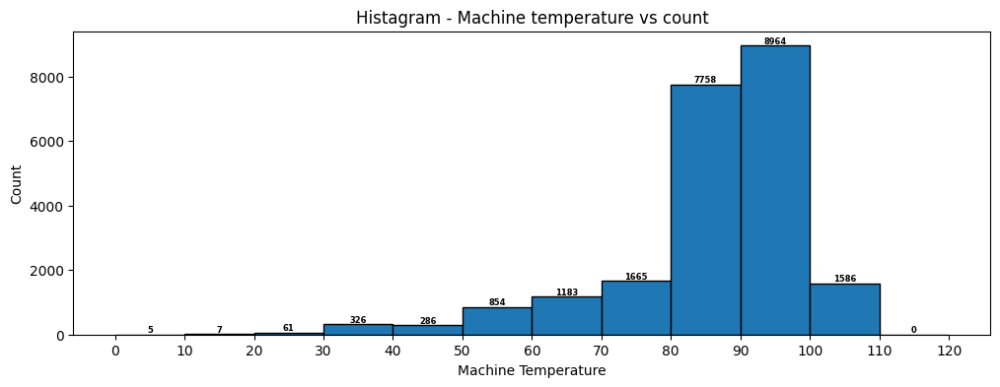

In [8]:
# Histagram
bin_size = range(0, 121, 10)
plt.figure(figsize=(12, 4))
value_count, baredge, bar = plt.hist(df['value'], bins=bin_size, edgecolor='black')

for c, edge, bar_ in zip(value_count, baredge, bar):
    plt.text(
        bar_.get_x() + bar_.get_width() / 2,
        bar_.get_height(),
        int(c),
        ha='center',
        va='bottom',
        fontsize=6,
        fontweight='bold',
        color='black',
    )
plt.xlabel('Machine Temperature')
plt.ylabel('Count')
plt.xticks(bin_size)
plt.title('Histagram - Machine temperature vs count')
plt.show()

Majority of temperature is around 80~100 degree

### Anomaly Detection
- Z score method: Rolling mean +/- 3sigma
  - Robustness improvement: rolling median and rolling MAD
- Forecasting model + Prediction interval breaches

#### Z score method

#### Rolling mean & Rolling std
**Rolling Mean (Moving average)**
- Rolling mean calculates the average of the most recent k point values. E.g. rolling mean of point t4 is average value of point t2, t3, and t4 (The most recent 3 point value). Rolling mean(t4) = mean(t2, t3, t4)
- Rolling mean gives insight about local trend
- High k: more global focus; Low k: more local focus

**Rolling standard deviation**
- Rolling std calculates how spread the most recent k point value is. E.g. rolling std of point t4 is sdt value of point t2, t3, and t4 (The most recent 3 values). Rolling std(t4) = std(t2, t3, t4)
- Rolling std gives insight about local stability

#### Rolling median & Rolling MAD: Used since they use median instead of mean to prevent dramatic change to peak value
**Rolling median**
- Calculate the median value of the most recent k point values

**Rolling MAD**
- Calculate the median absolute deviation of the most recent k point values

In [9]:
rolling_window = 1300
# Rolling mean
df['Rolling Mean'] = df['value'].rolling(rolling_window).mean()
'''
rolling_mean_list  = []
rolling_window = 280
for i in range(df.shape[0] + 1):
    start = i - rolling_window + 1
    end = i
    # print(i, start, end)
    if start < 0:
        rolling_mean_list.append(np.NaN)
        continue
    rolling_mean = round(df.loc[start:end, 'value'].mean(), 6)
    rolling_mean_list.append(rolling_mean)
    # print(df.loc[start:end, 'value'])
# print(rolling_mean_list)

df['Rolling Mean'] = pd.DataFrame(rolling_mean_list)
'''

# Rolling std
df['Rolling std'] = df['value'].rolling(rolling_window).std()
'''
rolling_std_list = []
for i in range(df.shape[0] + 1):
    start = i - rolling_window + 1
    end = i
    if start < 0:
        rolling_std_list.append(np.NaN)
        continue
    rolling_std = round(df.loc[start:end, 'value'].std(),6)
    rolling_std_list.append(rolling_std)
df['Rolling std'] = pd.DataFrame(rolling_std_list)
'''

# Rolling median
df['Rolling Median'] = df['value'].rolling(rolling_window).median()

# Rolling MAD
df['Rolling MAD'] = df['value'].rolling(rolling_window).apply(lambda x: (x - x.median()).abs().median())

In [10]:
df

,timestamp,value,time,Rolling Mean,Rolling std,Rolling Median,Rolling MAD
0,2013-12-02 21:15:00,73.967322,2013-12-02 21:15:00,NaN,NaN,NaN,NaN
1,2013-12-02 21:20:00,74.935882,2013-12-02 21:20:00,NaN,NaN,NaN,NaN
2,2013-12-02 21:25:00,76.124162,2013-12-02 21:25:00,NaN,NaN,NaN,NaN
3,2013-12-02 21:30:00,78.140707,2013-12-02 21:30:00,NaN,NaN,NaN,NaN
4,2013-12-02 21:35:00,79.329836,2013-12-02 21:35:00,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...
22690,2014-02-19 15:05:00,98.185415,2014-02-19 15:05:00,94.067459,3.594329,92.951579,2.0681
22691,2014-02-19 15:10:00,97.804168,2014-02-19 15:10:00,94.068435,3.595172,92.951579,2.0681
22692,2014-02-19 15:15:00,97.135468,2014-02-19 15:15:00,94.068482,3.595211,92.951579,2.0681
22693,2014-02-19 15:20:00,98.056852,2014-02-19 15:20:00,94.069394,3.596074,92.951579,2.0681


In [11]:
# Threshold from rolling mean and rolling std
df['Upper bound-mean/std'] = df['Rolling Mean'] + 3 * df['Rolling std']
df['Lower bound-mean/std'] = df['Rolling Mean'] - 3 * df['Rolling std']

# Threshold from rolling median and rolling MAD
df['Upper bound-median/MAD'] = df['Rolling Median'] + 3 * 1.4826 * df['Rolling MAD']  # sigma_robust = 1.4826 * rolling MAD
df['Lower bound-median/MAD'] = df['Rolling Median'] - 3 * 1.4826 * df['Rolling MAD']
df

,timestamp,value,time,Rolling Mean,Rolling std,Rolling Median,Rolling MAD,Upper bound-mean/std,Lower bound-mean/std,Upper bound-median/MAD,Lower bound-median/MAD
0,2013-12-02 21:15:00,73.967322,2013-12-02 21:15:00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,2013-12-02 21:20:00,74.935882,2013-12-02 21:20:00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,2013-12-02 21:25:00,76.124162,2013-12-02 21:25:00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,2013-12-02 21:30:00,78.140707,2013-12-02 21:30:00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,2013-12-02 21:35:00,79.329836,2013-12-02 21:35:00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...
22690,2014-02-19 15:05:00,98.185415,2014-02-19 15:05:00,94.067459,3.594329,92.951579,2.0681,104.850445,83.284472,102.150075,83.753084
22691,2014-02-19 15:10:00,97.804168,2014-02-19 15:10:00,94.068435,3.595172,92.951579,2.0681,104.853952,83.282919,102.150075,83.753084
22692,2014-02-19 15:15:00,97.135468,2014-02-19 15:15:00,94.068482,3.595211,92.951579,2.0681,104.854115,83.282848,102.150075,83.753084
22693,2014-02-19 15:20:00,98.056852,2014-02-19 15:20:00,94.069394,3.596074,92.951579,2.0681,104.857616,83.281173,102.150075,83.753084


In [12]:
# Visualization - Line plot
def plot_temp_over_time(use_mode='mean/std', plot_rolling=False, plot_threshold=False, plot_anomaly=False):
    '''
    use_mode: To define using rolling mean/ rolling std or rolling median/ rolling MAD. 'mean/std' by default. Options: 'mean/std' and 'median/mad'

    '''
    plt.figure(figsize=(16, 4.5))
    plt.plot(df['time'], df['value'], label='Temperature-Raw')

    if use_mode == 'mean/std':
        if plot_rolling:
            plt.plot(df['time'], df['Rolling Mean'], linestyle='--', label='Temperature-Rolling mean')
        
        if plot_threshold:
            plt.plot(df['time'], df['Upper bound-mean/std'], linestyle='--', label='Upper bound')
            plt.plot(df['time'], df['Lower bound-mean/std'], linestyle='--', label='Lower bound')
    
        if plot_anomaly:
            df_anomaly = df[(df['value'] >= df['Upper bound-mean/std']) | (df['value'] <= df['Lower bound-mean/std'])]
            plt.plot(df_anomaly['time'], df_anomaly['value'], 'ro', label='Anomaly', markersize=3)

    elif use_mode == 'median/mad':
        if plot_rolling:
            plt.plot(df['time'], df['Rolling Median'], linestyle='--', label='Temperature-Rolling median')
        
        if plot_threshold:
            plt.plot(df['time'], df['Upper bound-median/MAD'], linestyle='--', label='Upper bound')
            plt.plot(df['time'], df['Lower bound-median/MAD'], linestyle='--', label='Lower bound')
    
        if plot_anomaly:
            df_anomaly = df[(df['value'] >= df['Upper bound-median/MAD']) | (df['value'] <= df['Lower bound-median/MAD'])]
            plt.plot(df_anomaly['time'], df_anomaly['value'], 'ro', label='Anomaly', markersize=3)
    
    plt.xlabel('Time')
    plt.ylabel('Machine Temperature')
    plt.xticks(fontsize=8)
    plt.gca().xaxis.set_major_locator(mdates.DayLocator(interval=6))
    plt.title('Machine temperature over time')
    plt.legend(loc='best')
    plt.show()

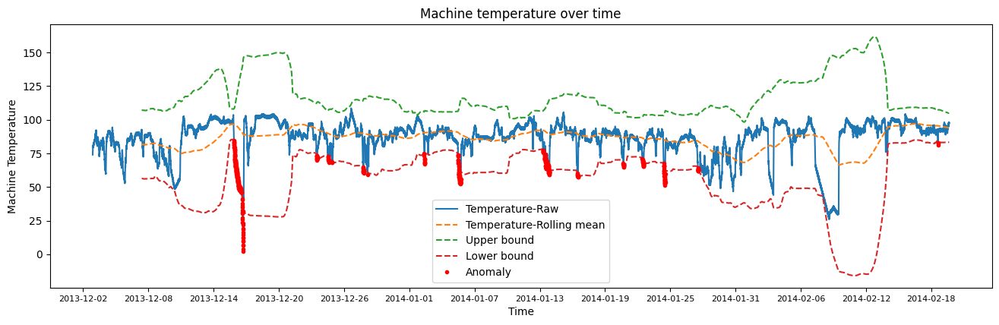

In [13]:
plot_temp_over_time(use_mode='mean/std', plot_rolling=True, plot_threshold=True, plot_anomaly=True)

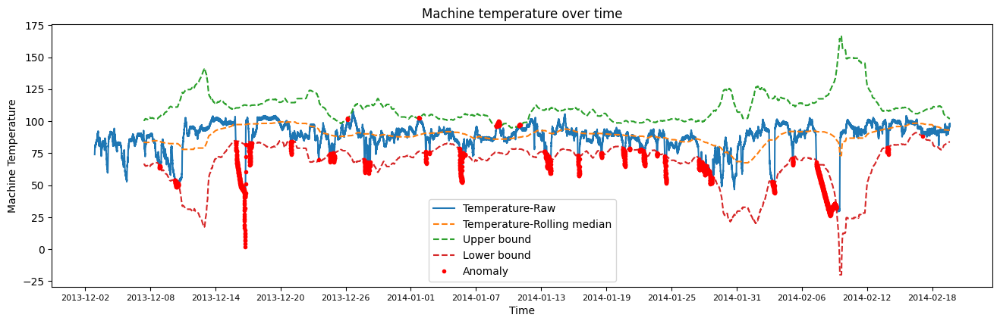

In [14]:
plot_temp_over_time(use_mode='median/mad', plot_rolling=True, plot_threshold=True, plot_anomaly=True)

In [15]:
# Visualization - Plotly
def plot_temp_over_time_plotly(use_mode='mean/std', plot_rolling=False, plot_threshold=False, plot_anomaly=False):
    fig = px.line(df,
                  x='time', 
                  y='value',
                  labels={
                      "value": "Machine Temperature"
                  },
                  width=1200,
                  height=450
                 )
    
    if use_mode == 'mean/std':
        if plot_rolling:
            fig.add_scatter(x=df['time'],
                            y=df['Rolling Mean'],
                            name='Rolling mean'
                           )
        if plot_threshold:
            fig.add_scatter(x=df['time'],
                            y=df['Upper bound-mean/std'],
                            name='Upper bound'
                           )
            fig.add_scatter(x=df['time'],
                            y=df['Lower bound-mean/std'],
                            name='Lower bound'
                           )
    
        if plot_anomaly:
            df_anomaly = df[(df['value'] >= df['Upper bound-mean/std']) | (df['value'] <= df['Lower bound-mean/std'])]
            fig.add_scatter(x=df_anomaly['time'],
                            y=df_anomaly['value'],
                            mode='markers',
                            marker=dict(color='red', size=6),
                            name='Anomaly'
                           )
    
    elif use_mode == 'median/mad':
        if plot_rolling:
            fig.add_scatter(x=df['time'],
                            y=df['Rolling Median'],
                            name='Rolling median'
                           )
        if plot_threshold:
            fig.add_scatter(x=df['time'],
                            y=df['Upper bound-median/MAD'],
                            name='Upper bound'
                           )
            fig.add_scatter(x=df['time'],
                            y=df['Lower bound-median/MAD'],
                            name='Lower bound'
                           )
    
        if plot_anomaly:
            df_anomaly = df[(df['value'] >= df['Upper bound-median/MAD']) | (df['value'] <= df['Lower bound-median/MAD'])]
            fig.add_scatter(x=df_anomaly['time'],
                            y=df_anomaly['value'],
                            mode='markers',
                            marker=dict(color='red', size=6),
                            name='Anomaly'
                           )    
    fig.for_each_trace(lambda t: t.update(
        name={
            'value': 'Temperature-Raw',
            '': 'Temperature-Raw',
        }.get(t.name, t.name)
    ))

    fig.update_traces(
        showlegend=True,
        selector=dict(name='Temperature-Raw')
    )
    
    fig.update_layout(
        legend_title_text=''
    )

    fig.show()

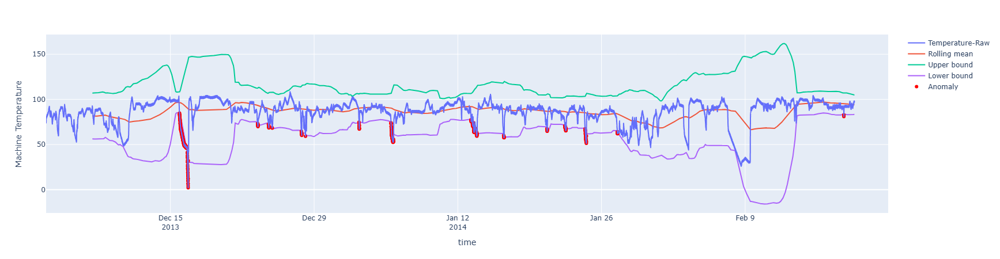

In [16]:
plot_temp_over_time_plotly(use_mode='mean/std', plot_rolling=True, plot_threshold=True, plot_anomaly=True)

Rolling mean and rolling MAD is sensitive to value change

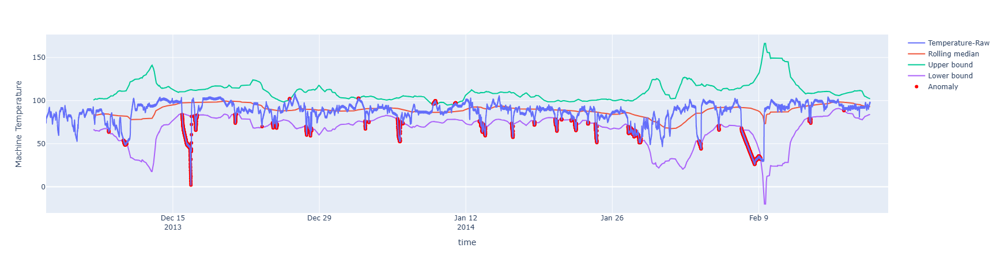

In [17]:
plot_temp_over_time_plotly(use_mode='median/mad', plot_rolling=True, plot_threshold=True, plot_anomaly=True)

**Z score method summary**
- Line plot visualization with matplotlib for report and plotly for exploratory
- Z score method is sensitive to rolling window for anomaly detection. Z score method defines the normal context.
- To catch anomaly, rolling window can be set longer. In this case, threshold will take wide range of data (include realistically normal data value, ramp-up, and peak value) into account for detection.
  - Short rolling window: Rolling mean and std change to follow trend.
  - Longer rolling window than anomaly period: mean stays relatively stable and std considers normal data (anomaly contributes less weight) to make anomaly stand out.
- Rolling mean/std vs rolling median/MAD
  - Thresholds from both ways reflects sensitively to peak value
  - Rolling window is 300: Threshold remains similar level when temperatue is out of peak area. It is observed that threshold of rolling median/MAD turns out changing more dramatically than rolling mean/std during peak area.  
    Reasons are 
    - Middle position changes to position with high value (peak area) as rolling calculation goes on. It then contributes sudden jump in median then MAD
    - Mean approach will not cause sudden jump since low value will dilute influence from high value
  - Rolling window is 600: Thresholds from both methods during peak area shows less dramatic change. Observed that rolling median/MAD report more points as anomaly when it is out of peak area
  - Rolling window is 1000: Thresholds from both methods becomes more uniform compared window as 600. Both ways can flag anomaly earlier before peak value shows. It demonstrates early anomaly detection.
  - Rolling window is from 1200 to 1500: rolling mean/std will gradually miss flagging anomaly earlier before 2nd peak shows. Rolling median/MAD can still flag anomaly earlier before peak values
- Rolling window affects threshold profile (threshold becomes too big during anomaly period) and then anomaly detection capability

#### Forecating model + Prediction interval breaches
- Autocorrelation to discover seasonal period
- Decompose time series data --> No need since 
- Forecase model built-up

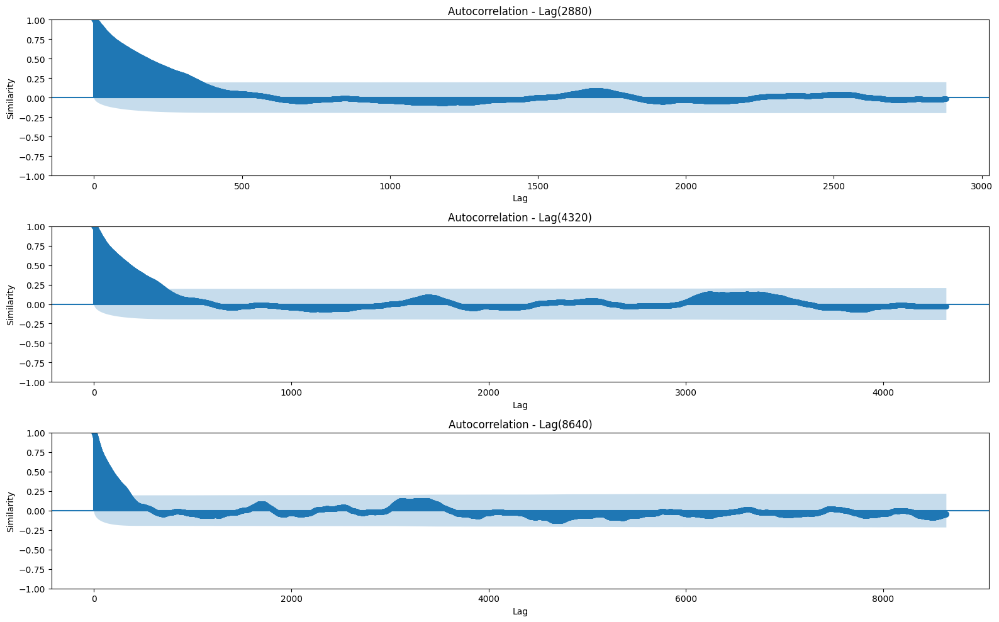

In [22]:
# Autocorrelation plot to discover seasonality without detrend
'''
This is how we get the similarity over each lag
acf_values = acf(df['value'], nlags=15000)

for lag, similarity in enumerate(acf_values):
    print(f'Lag: {lag} and Similarity value is {similarity}')

df_acf = pd.DataFrame(enumerate(acf_values), columns=['Lag value', 'Similarity'])
print(df_acf)
'''
lag_option = [2880, 4320, 8640]  # lag is 10 days, 15 days and 30 days
fig, ax = plt.subplots(3, 1, figsize=(16,10))  # Use this way to change the figure size in plot_acf
for i, lag in enumerate(lag_option):
    plot_acf(df['value'], lags=lag, ax=ax[i])
    ax[i].set_xlabel('Lag')
    ax[i].set_ylabel('Similarity')
    ax[i].set_title(f'Autocorrelation - Lag({lag})')
plt.tight_layout()
plt.show()

Without trend component removed, do not see the seasonal characteristic from ACF plot after 10/15/30 days lag

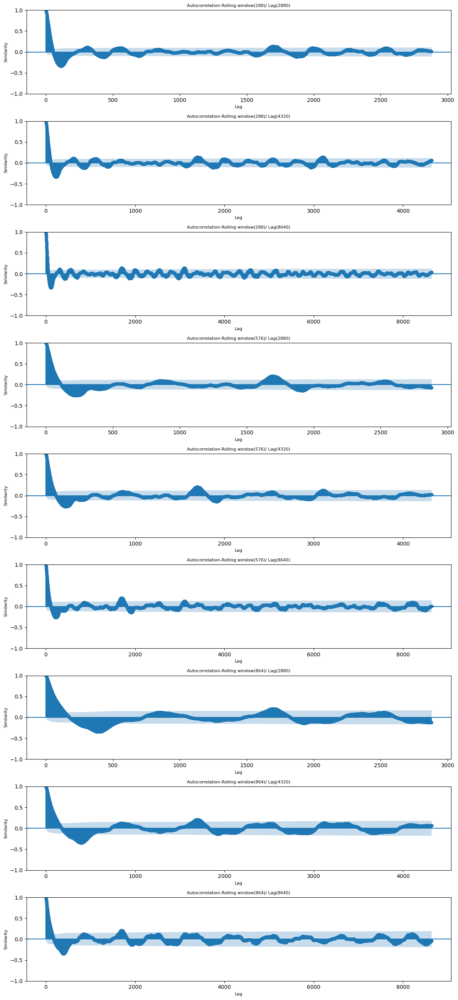

In [43]:
# Autocorrelation plot to discover seasonality with detrend
rolling_window_acf = [288, 288 * 2, 288 * 3]

i = 0
fig, ax = plt.subplots(9, 1, figsize=(12, 26))
for r, lag in list(product(rolling_window_acf, lag_option)):
    temp_trend = df['value'].rolling(r, center=True).mean()
    temp_detrended = df['value'] - temp_trend
    temp_detrended = temp_detrended.dropna()
    plot_acf(temp_detrended, lags=lag, ax=ax[i])
    ax[i].set_xlabel('Lag', fontsize=8)
    ax[i].set_ylabel('Similarity', fontsize=8)
    ax[i].set_title(f'Autocorrelation-Rolling window({r})/ Lag({lag})', fontsize=8)
    i += 1
plt.tight_layout()
plt.show()


With trend component removed, do not see the seasonal characteristic from ACF plot with rolling window of 1/2/3 days and lag of 10/15/30 days